## Preprocessing and Visualising Data

+ **This notebook aims to visualize the data as well as converting the bounding boxes provided in the training.json file into a format we can feed the YOLO algorithm later on.**

In [24]:
#Importing libraries
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import random
import matplotlib.image as mpimg
import seaborn as sns
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
from pathlib import Path
from skimage.io import imread
from skimage.color import label2rgb
from shutil import copyfile
from PIL import Image
%matplotlib inline

## Visualising raw data

In [25]:
N_SAMPLE = 10 #Number of images to show
# You should set you images dir below
#IMAGES_DIR = "C:/Users/adria/Desktop/UPNA/2º AÑO/2 SEMESTRE/INTELIGENCIA COMPUTACIONAL/TRABAJO 2/malaria/test_img"

In [26]:
imagePaths = os.listdir(IMAGES_DIR)

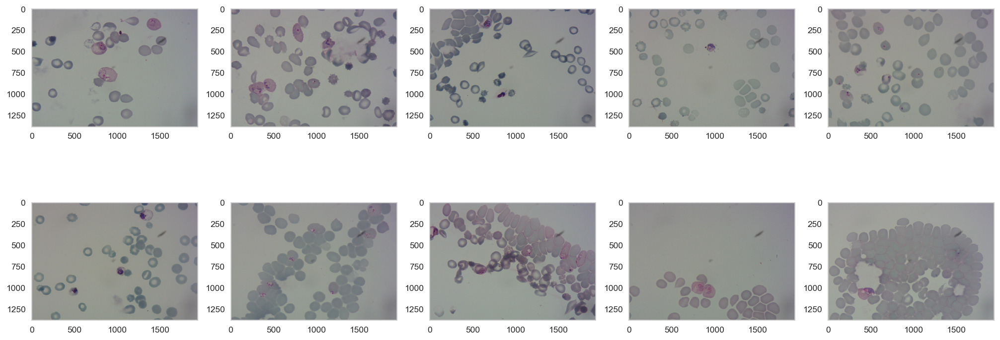

In [27]:
# Plotting some images
fig = plt.figure(figsize= (20, 20))
cols = 5
rows = 5

for i in range(N_SAMPLE):
    filePath = os.path.join(IMAGES_DIR, random.choice(imagePaths))
    ax1 = fig.add_subplot(rows, cols, i + 1)
    img = mpimg.imread(filePath,0)
    plt.imshow(img)
    
plt.show()

In [ ]:
#Plotting configuration
plt.rcParams["figure.figsize"] = (8, 8)
plt.rcParams["figure.dpi"] = 125
plt.rcParams["font.size"] = 14
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.style.use('ggplot')
sns.set_style("whitegrid", {'axes.grid': False})

In [22]:
#Path of the files
malaria_dir = Path("C:/Users/adria/Desktop/UPNA/2º AÑO/2 SEMESTRE/INTELIGENCIA COMPUTACIONAL/TRABAJO 2/malaria")

In [28]:
#Creating a dataframe from the json file
train_df = pd.read_json(malaria_dir / 'training.json')
train_df['path'] = train_df['image'].map(lambda x: malaria_dir / x['pathname'][1:])
train_df['image_available'] = train_df['path'].map(lambda x: x.exists())
print(train_df.shape[0], 'images')
train_df = train_df.query('image_available')
print(train_df.shape[0], 'images available')
train_df.sample(5)

1208 images
1208 images available


,image,objects,path,image_available
376,{'checksum': '43275e114f308b23bfb5d4e269c46a2a...,"[{'bounding_box': {'minimum': {'r': 195, 'c': ...",C:\Users\adria\Desktop\UPNA\2º AÑO\2 SEMESTRE\...,True
352,{'checksum': 'c7dd9fd0ed68fcf54b1d985b71fe8c67...,"[{'bounding_box': {'minimum': {'r': 257, 'c': ...",C:\Users\adria\Desktop\UPNA\2º AÑO\2 SEMESTRE\...,True
897,{'checksum': '604c456172d43435c6490bdf71f29c05...,"[{'bounding_box': {'minimum': {'r': 412, 'c': ...",C:\Users\adria\Desktop\UPNA\2º AÑO\2 SEMESTRE\...,True
735,{'checksum': 'a4bfa880455567b7e74dea016e7616bd...,"[{'bounding_box': {'minimum': {'r': 791, 'c': ...",C:\Users\adria\Desktop\UPNA\2º AÑO\2 SEMESTRE\...,True
111,{'checksum': '7eafb0025ea17cf7c34f4e06c47ff9ef...,"[{'bounding_box': {'minimum': {'r': 208, 'c': ...",C:\Users\adria\Desktop\UPNA\2º AÑO\2 SEMESTRE\...,True


In [31]:
#Classes
object_df = pd.DataFrame([dict(image=c_row['path'], **c_item) for _, c_row in train_df.iterrows() for c_item in c_row['objects']])
cat_dict = {v:k for k,v in enumerate(object_df['category'].value_counts().index, 1)}
print(object_df['category'].value_counts())

red blood cell    77420
trophozoite        1473
difficult           441
ring                353
schizont            179
gametocyte          144
leukocyte           103
Name: category, dtype: int64


## Preprocessing

+ Each bounding box provided for each image has the following format:
    _(lowest_row, lowest_column, highest_row, highest_column, class)_
+ For YOLO algorithm we want the inputs to be like:
    _(class, central_point_X, central_point_Y, width_of_bb, height_of_bb)_

In [38]:
#Function below converts the bounding boxes format provided into the YOLO's format
def convert(size, box):
    dw = 1./size[0]
    dh = 1./size[1]
    x = (box[0] + box[1])/2.0
    y = (box[2] + box[3])/2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)

+ Now we need a txt file for each image which contains all the bounding boxes inside in the format we described above

In [33]:
# We will get a file named as same as the image containing a row for each bounding box in that image.
# You should check the paths below to replicate
train_df = pd.read_json(malaria_dir / 'training.json')
train_df['path'] = train_df['image'].map(lambda x: malaria_dir / x['pathname'][1:])

for i in range(len(train_df)):
    in_row=train_df.iloc[i]
    copyfile(in_row['path'], "C:/Users/adria/Desktop/UPNA/2º AÑO/2 SEMESTRE/INTELIGENCIA COMPUTACIONAL/TRABAJO 2/malaria/data2/Imagen"+str(i)+".png")
    for c_obj in in_row['objects']:
        min_val = c_obj['bounding_box']['minimum']
        max_val = c_obj['bounding_box']['maximum']
        lab_id = cat_dict.get(c_obj['category'], 20)
        im=Image.open(in_row['path'])
        w= int(im.size[0])
        h= int(im.size[1])
        xmin = min_val['c']
        xmax = max_val['c']
        ymin = min_val['r']
        ymax = max_val['r']
        b = (float(xmin), float(xmax), float(ymin), float(ymax))
        bb = convert((w,h), b) 
        f = open("C:/Users/adria/Desktop/UPNA/2º AÑO/2 SEMESTRE/INTELIGENCIA COMPUTACIONAL/TRABAJO 2/malaria/data2/Imagen"+str(i)+".txt", "a")
        f.write(str(lab_id-1) + " " + " ".join([str(a) for a in bb]) + '\n')
        f.close()

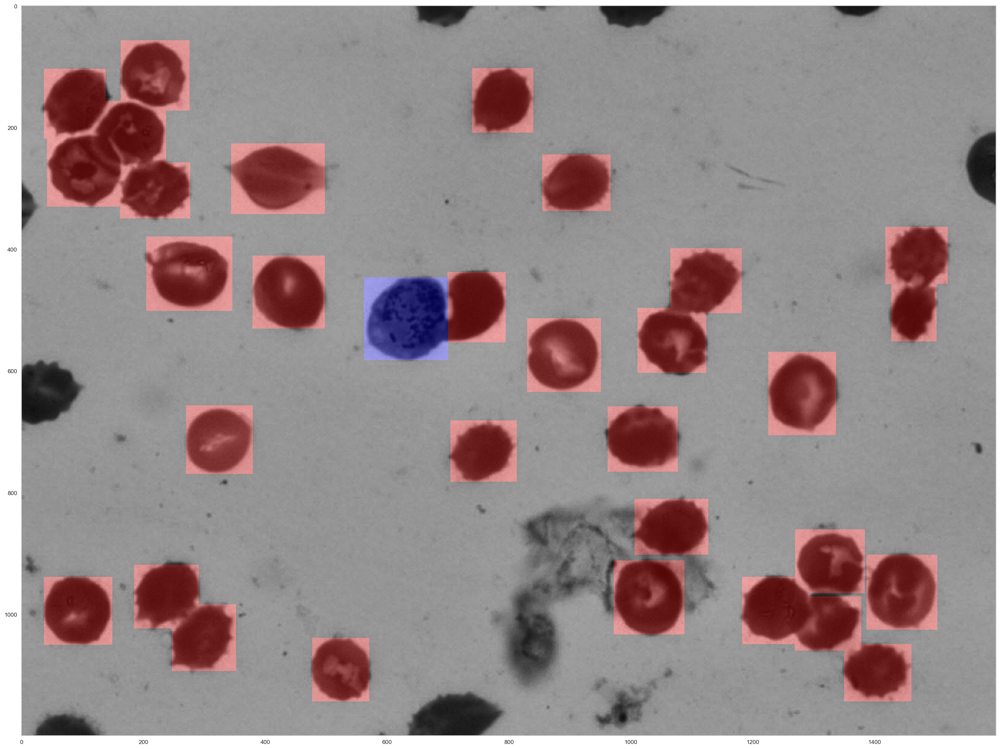

In [32]:
test_row = train_df.iloc[61]

#Function below shows an image with the bounding boxes in different colors based on the cell class
def show_image_boxes(in_row, ax=None):
    """Show a row with bounding boxes"""
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(30, 30))
    c_img = imread(in_row['path'])
    lab_img = np.zeros((c_img.shape[0], c_img.shape[1]), dtype='int')
    for c_obj in in_row['objects']:
        min_val = c_obj['bounding_box']['minimum']
        max_val = c_obj['bounding_box']['maximum']
        lab_id = cat_dict.get(c_obj['category'], 20)
        lab_img[slice(min_val['r'], max_val['r']), slice(min_val['c'], max_val['c'])] = lab_id
    ax.imshow(label2rgb(label=lab_img, image=c_img, bg_label=0))
    
show_image_boxes(test_row)

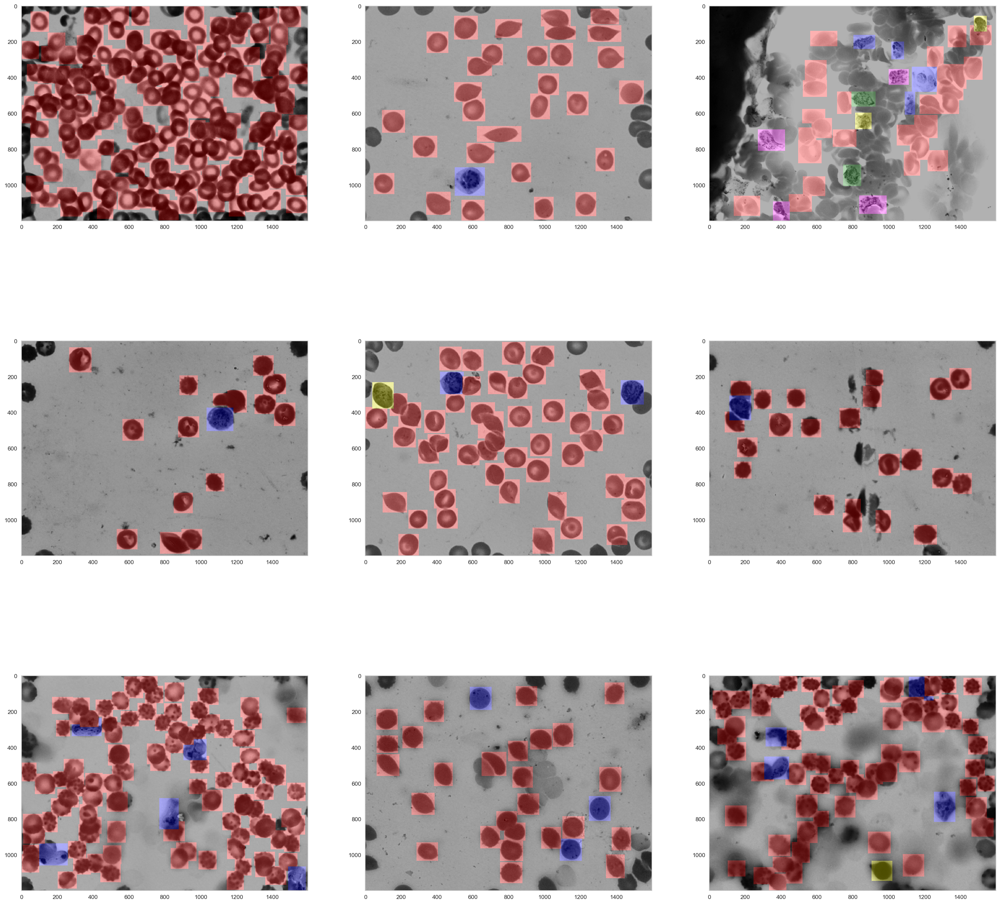

In [11]:
#Let's plot some more examples
fig, m_axs = plt.subplots(3, 3, figsize=(30, 30))
valid_img_list = object_df.groupby('category').apply(lambda x: x.sample(2)).reset_index(drop=True)['image'].values.tolist()
for c_ax, (_, c_row) in zip(m_axs.flatten(), train_df[train_df['path'].isin(valid_img_list)].iterrows()):
    show_image_boxes(c_row, ax=c_ax)